Source: https://www.kaggle.com/anokas/the-nature-conservancy-fisheries-monitoring/finding-boatids.

## Resolving the Boat structure

Here I'm going to try to cluster the images based on boat, automatically. This can be useful for us in a variety of ways, for example it would allow us to create a separate model for each boat, or mask out which parts of the boat can't contain fish in order to help our classifier detect the fish.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="dark")
%matplotlib inline

In [2]:
import cv2 # opencv library
import glob # get the list of all files in a folder
import random
from tqdm import tqdm # progress bar
import multiprocessing # create many threads to run
from sklearn.cluster import DBSCAN

In [3]:
# Function to show 4 images
def show_four(imgs, title):
    #select_imgs = [np.random.choice(imgs) for _ in range(4)]
    select_imgs = [imgs[np.random.choice(len(imgs))] for _ in range(4)]
    _, ax = plt.subplots(1, 4, sharex='col', sharey='row', figsize=(20, 3))
    plt.suptitle(title, size=20)
    for i, img in enumerate(select_imgs):
        ax[i].imshow(img)

# Function to show 8 images
def show_eight(imgs, title):
    select_imgs = [imgs[np.random.choice(len(imgs))] for _ in range(8)]
    _, ax = plt.subplots(2, 4, sharex='col', sharey='row', figsize=(20, 6))
    plt.suptitle(title, size=20)
    for i, img in enumerate(select_imgs):
        ax[i // 4, i % 4].imshow(img)

In [4]:
%%time
select = 500 # Only load 500 images for speed
# Data loading
# key is a function which takes element in the list and returns its
# value to sort
train_files = sorted(glob.glob('../data/train/*/*.jpg'),
                     key=lambda x: random.random())[:select]
train = np.array([cv2.imread(img) for img in train_files])
print('Length of train {}'.format(len(train)))

Length of train 500
CPU times: user 11.2 s, sys: 372 ms, total: 11.5 s
Wall time: 11.9 s


### Image Size

The images in the training set are not all the same size, but rather there are a few distinct image sizes that we have to work with. Maybe there are some image sizes which only contain a single boat? Let's try treating the image sizes as BoatIDs and check!

In [5]:
print('Sizes in train:')
shapes = np.array([str(img.shape) for img in train])
pd.Series(shapes).value_counts()

Sizes in train:


(720, 1280, 3)    281
(750, 1280, 3)     66
(974, 1280, 3)     54
(718, 1276, 3)     39
(670, 1192, 3)     36
(924, 1280, 3)      7
(974, 1732, 3)      6
(854, 1518, 3)      5
(700, 1244, 3)      5
(750, 1334, 3)      1
dtype: int64

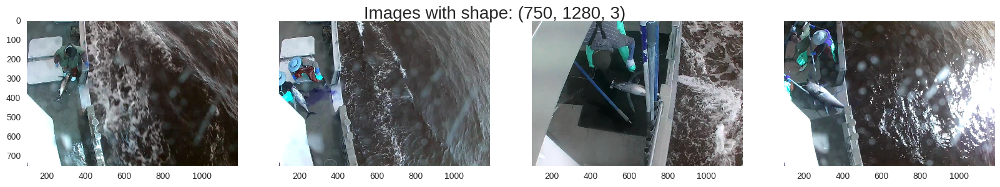

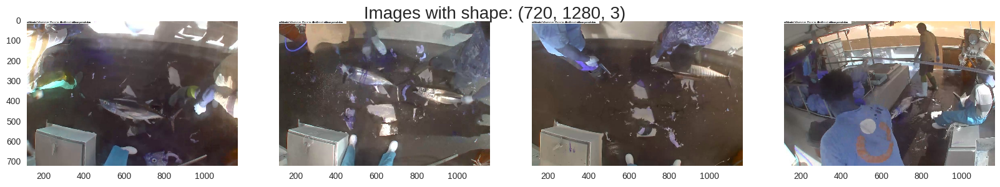

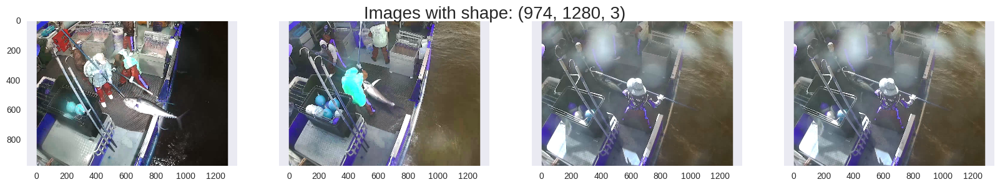

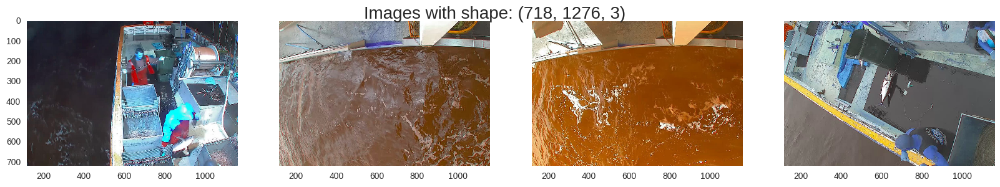

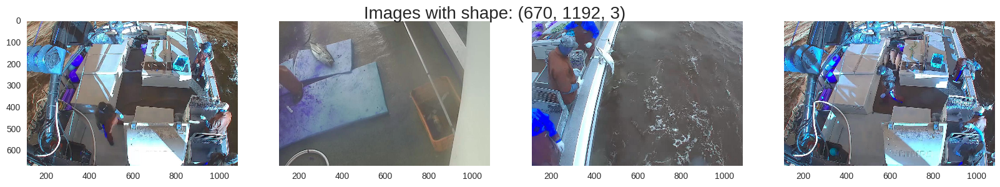

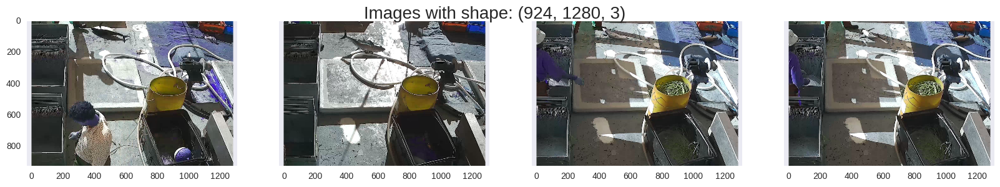

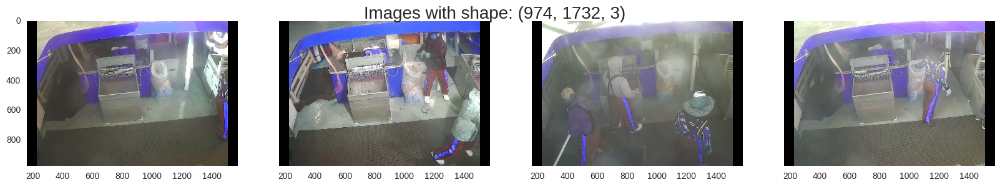

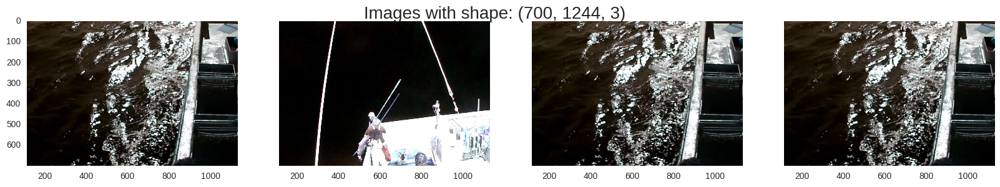

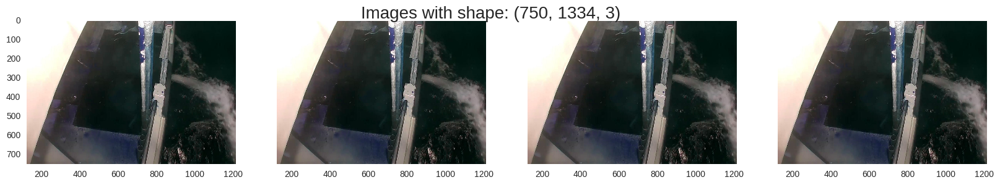

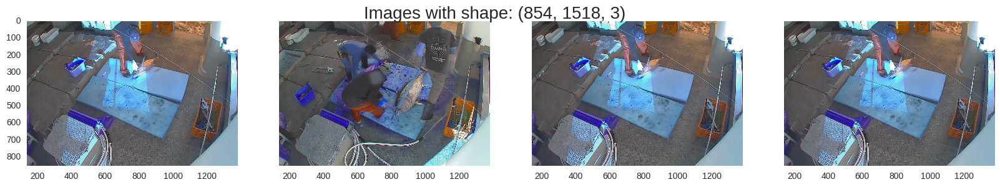

In [6]:
for uniq in pd.Series(shapes).unique():
    show_four(train[shapes == uniq], 'Images with shape: {}'.format(uniq))
    plt.show()

Here we can see that, with the exception of (854, 1518, 3), all the other image sizes all contain more than one boat. It looks like while this may be helpful, we need to take another approach to truly separate the boats.

## Boat Clustering

Here I'm just going to work on just these 500 loaded images for speed, but there's nothing stopping you from doing exactly the same thing with all the images.

My approach has three steps:
- Normalise all the images by subtracting the mean (of that image) and dividing by the stdev.
- Treat the mean absolute pixel error between the images as the distance between the image.
- Use this to create a precomputed distance matrix, and then pass the points to DBSCAN to create the boat clusters.

In [7]:
# Function for computing distance between images
def compare(args):
    img, img2 = args
    img = (img - img.mean()) / img.std()
    img2 = (img2 - img2.mean()) / img2.std()
    return np.mean(np.abs(img - img2))

In [8]:
%%time
# Resize the images to speed it up.
train = [cv2.resize(img, (224, 224), cv2.INTER_LINEAR) for img in train]

CPU times: user 428 ms, sys: 0 ns, total: 428 ms
Wall time: 427 ms


In [9]:
# Create the distance matrix in a multithreaded fashion
pool = multiprocessing.Pool(6)
#bar = progressbar.ProgressBar(max=len(train))
distances = np.zeros((len(train), len(train)))
for i, img in enumerate(tqdm(train)): #enumerate(bar(train)):
    all_imgs = [(img, f) for f in train]
    dists = pool.map(compare, all_imgs)
    distances[i, :] = dists

100%|██████████| 500/500 [06:09<00:00,  1.36it/s]     | 1/500 [00:00<06:15,  1.33it/s]


Now I have a NxN matrix where N is the number of images, denoting the distances between the images.

Some clustering algorithms in SKLearn allow you to use a precomputed distance matrix instead of letting the algorithm compute it, which is very useful in cases like here where you can work out the distance between points but you can't give each image coordinates. Here I'll be using the DBSCAN algorithm.

Let's take a peek at our distance matrix:

[[ 0.          0.86252586  1.07690997 ...,  1.23466255  0.98810162
   0.97068246]
 [ 0.86252586  0.          1.17193308 ...,  1.209656    1.09916471
   0.89604218]
 [ 1.07690997  1.17193308  0.         ...,  0.83638999  1.01750701
   1.14457772]
 ..., 
 [ 1.23466255  1.209656    0.83638999 ...,  0.          1.13752014
   1.12301097]
 [ 0.98810162  1.09916471  1.01750701 ...,  1.13752014  0.          1.08702108]
 [ 0.97068246  0.89604218  1.14457772 ...,  1.12301097  1.08702108  0.        ]]



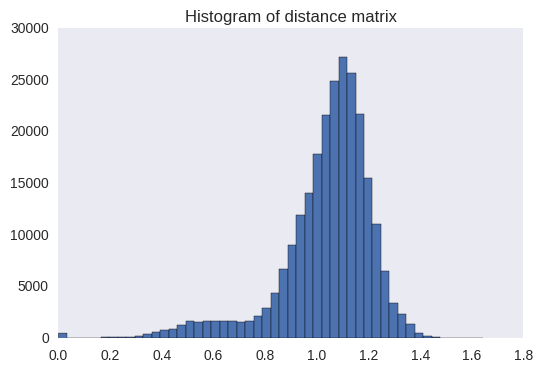

In [10]:
print(distances)
plt.hist(distances.flatten(), bins=50)
plt.title('Histogram of distance matrix')
print('')

We can see here that we have an area below 0.8. My hypothesis is that this is the area where two images are of the same boat. By default, DBSCAN considers up to a 0.5 distance to be in the same cluster. I tweaked the parameters and found that 0.6 is the best value, which makes reasonable sense looking at the histogram.

In [11]:
cls = DBSCAN(metric='precomputed', min_samples=5, eps=0.6)
y = cls.fit_predict(distances)
print(y)
print('Cluster sizes:')
print(pd.Series(y).value_counts())

[-1  0  1  1  2 -1  0  3  3 -1  4  0  5  6 -1  7  8  5  5 -1  1  5  5  9 -1
  5 -1  7  6 -1  8  0 10 11 -1 19  6  8 -1 12  0 -1  5  2 10 17 -1  5 -1  1
 -1  1  5 -1  0 -1  0  5  5 -1 13 -1 -1  2 -1 -1  4  7 19 -1 -1 -1  0  5  9
  8 14  0  1 10 -1 -1  1  0  6 -1  5  8  0 -1  9 -1  1 -1  4  1  6  0  0 -1
  7  6  5  0  5 -1 -1  8  0 -1 -1  8  5  5  5  2  5 -1 13 -1 -1 14  0 -1  9
  5 -1  5  8  5 -1  0  8 12  1  8  5  0  5  8  5  5  5 -1  0  0 -1  5  6 12
  0 15  5 -1  5  5  5  8  8 -1  6  8 -1 -1 -1 12  5  0  8  8 -1  8  5 -1 -1
 16  5 -1 -1 11 -1 -1  5  2  2 -1  5  5  5  8  5  5 -1 11 -1 -1  8  5 -1  8
 -1  0  5 -1  5 16 -1 -1 -1  5  5 16  0 -1 14 -1  1 -1 -1 -1 -1 -1  5 -1 14
 -1  5  5  7  5  2  5 -1  5 -1 16  5  0  5  8 10 -1  8  5  2 -1  1 14  6  8
 15 -1 -1 17  5 -1  5  5  0 -1  9  2  1 -1  8 13 13  8  8  0  8  0  1  8  8
  8  5 -1 10  5  0 -1 10  8  5 18 -1  5 -1  8 -1  9  5  7 11  2 19  8  0 14
 -1  0  5 -1  1 -1 -1  7  8 -1  0  6  0  5  2 18 -1 15  7 -1  0 -1  0 -1  5
 -1 15 -1 -1

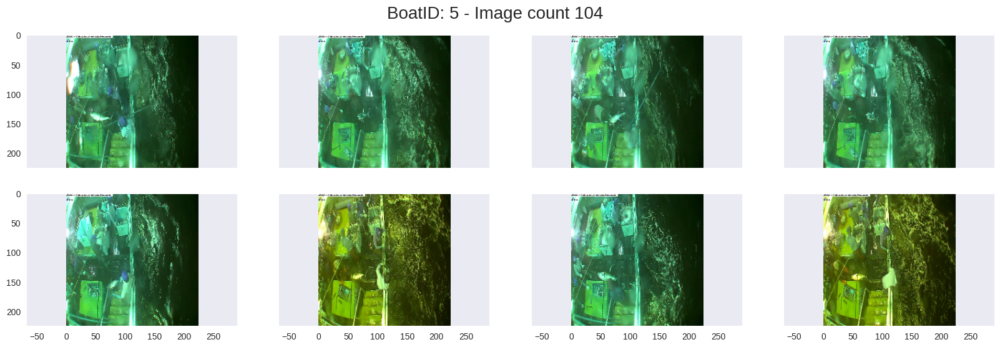

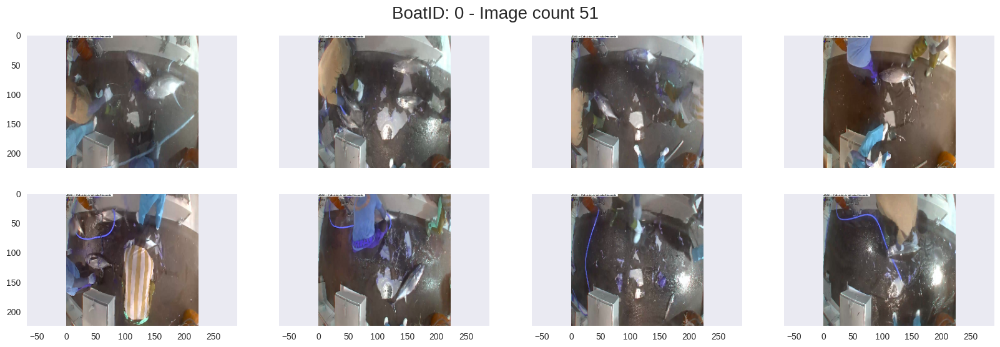

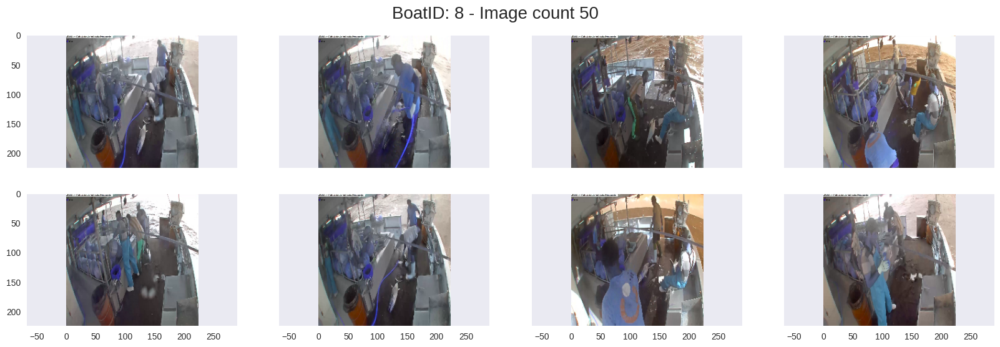

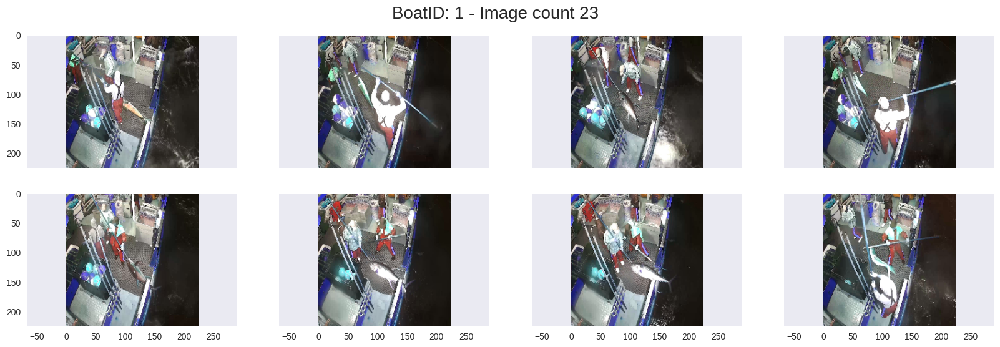

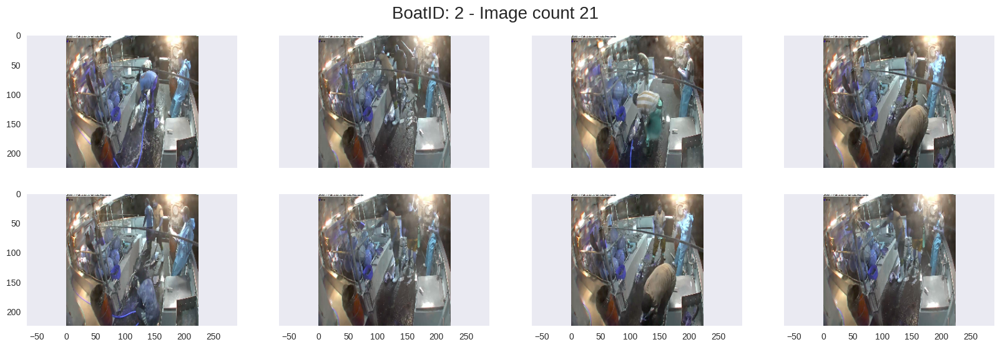

...

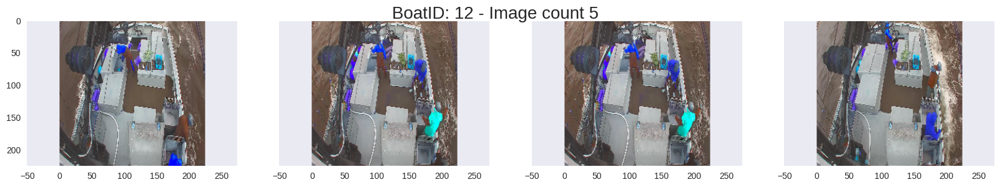

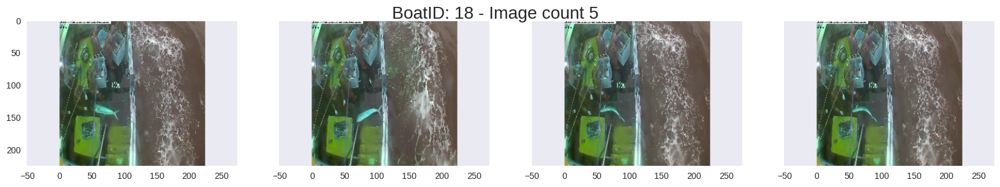

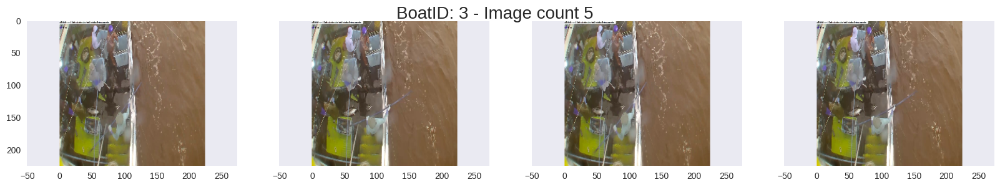

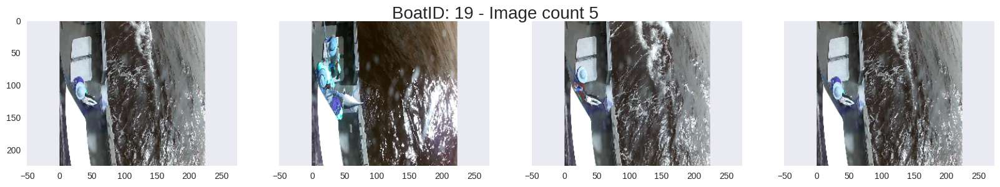

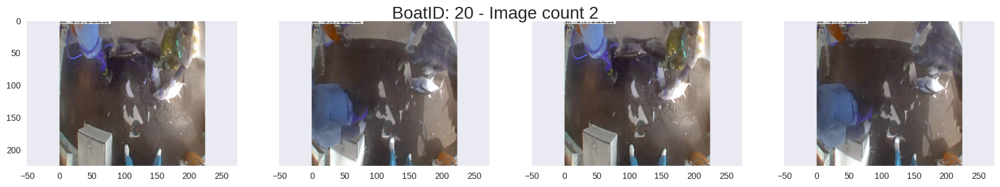

In [12]:
for uniq in pd.Series(y).value_counts().index:
    if uniq != -1:
        size = len(np.array(train)[y == uniq])
        if size > 10:
            show_eight(np.array(train)[y == uniq],
                       'BoatID: {} - Image count {}'.format(uniq, size))
            plt.show()
        else:
            show_four(np.array(train)[y == uniq],
                      'BoatID: {} - Image count {}'.format(uniq, size))
            plt.show()        

This is working surprisingly well!

However, we have a bunch of images that haven't been clustered into any BoatID. There are two possible reasons for these:
1. There are less than 5 images from the boat, which I have set as the threshold for a boatID.
2. The distance function is not good enough to cluster the images (eg. some images may be in the night vs the day - this would break my algorithm.)

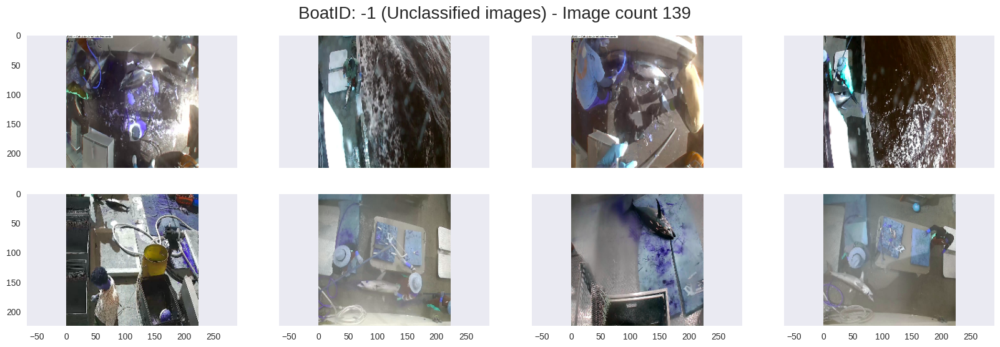

In [13]:
size = len(np.array(train)[y == -1])
show_eight(np.array(train)[y == -1],
           ('BoatID: {} (Unclassified images) - Image count {}'
           .format(-1, size)))

Some of these I can cluster by eye, so it looks like the algorithm needs some tweaking to be able to cluster every image!

However, I think this can be considered a sucess as I've managed to cluster the boats very precisely, while clustering >75% of the boats. Since this is unsupervised, it can be run on the test set to in order to understand which boat is which!

Any feedback is very much appreciated, along with any upvotes for motivation ;)

Good luck!